**Student**: Dimitrije Volarević IT51-2019

**Predmet**: Principi prezentacije i prepoznavanja oblika

**Klasifikacija**
Klasifikacija je jedan od tipova nadgledanog učenja, čija svrha je da predvidi kategorizovane klasne oznake novih instanci na osnovu prethodnih opservacija ili ulaza. U oblasti mašinskog učenja, klasifikacija podrazumeva proces predviđanja klase kojoj ulazni podatak najverovatnije pripada [2].

Za uspešno obavljanje klasifikacije, neophodno je imati veliki broj ulaznih podataka koji se koriste za treniranje neuronske mreže koja će se koristiti za klasifikaciju. Ti ulazni podaci trebaju biti raznoliki i obuhvatiti primere iz svih mogućih izlaznih klasa, kako bi neuronska mreža bila što bolje obučena [2].

**Skup podataka**
U okviru ovog projekta, koristili smo skup podataka koji sadrži slike LEGO figura različitih likova. Cilj klasifikacije je odrediti kojoj klasi pripada svaka slika, odnosno identifikovati lika prikazanog na slici. Za ovu svrhu, primenili smo algoritam klasifikacije zvani **DenseNet121**.

U ovoj ćeliji se koristi !pip install gdown komanda koja instalira gdown biblioteku. **Gdown** je Python biblioteka koja omogućava preuzimanje datoteka sa Google Drive-a pomoću njihovih ID-jeva.

In [44]:
!pip install gdown

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:
import gdown

U ovoj ćeliji se koristi **!gdown --fuzzy** komanda koja preuzima datoteku sa Google Drive-a. Datoteka se preuzima korišćenjem URL-a koji je dat kao argument.

In [6]:
!gdown --fuzzy https://drive.google.com/file/d/1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk/view?usp=sharing

Downloading...
From: https://drive.google.com/uc?id=1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk
To: /content/LEGO_Classification.zip
100% 30.2M/30.2M [00:03<00:00, 8.23MB/s]


Dekompresija preuzetog ZIP fajla

In [7]:
!unzip LEGO_Classification.zip

Archive:  LEGO_Classification.zip
  inflating: LICENSE                 
  inflating: harry-potter/0001/001.jpg  
  inflating: harry-potter/0001/002.jpg  
  inflating: harry-potter/0001/003.jpg  
  inflating: harry-potter/0001/004.jpg  
  inflating: harry-potter/0001/005.jpg  
  inflating: harry-potter/0001/006.jpg  
  inflating: harry-potter/0001/007.jpg  
  inflating: harry-potter/0001/008.jpg  
  inflating: harry-potter/0001/009.jpg  
  inflating: harry-potter/0001/010.jpg  
  inflating: harry-potter/0001/011.jpg  
  inflating: harry-potter/0001/012.jpg  
  inflating: harry-potter/0001/013.jpg  
  inflating: harry-potter/0002/001.jpg  
  inflating: harry-potter/0002/002.jpg  
  inflating: harry-potter/0002/003.jpg  
  inflating: harry-potter/0002/004.jpg  
  inflating: harry-potter/0002/005.jpg  
  inflating: harry-potter/0002/006.jpg  
  inflating: harry-potter/0002/007.jpg  
  inflating: harry-potter/0002/008.jpg  
  inflating: harry-potter/0002/009.jpg  
  inflating: harry-potter/

Importuju se potrebne Python biblioteke

In [37]:
import numpy as np
import pandas as pd
import seaborn as sns
import cv2
import os

import tensorflow as tf
from tensorflow.keras.applications import mobilenet_v2 as tf_mobilenet_v2
from tensorflow.keras import layers,models
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Flatten,Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import load_img,img_to_array

from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

Vrsi se graficki prikaz slika iz seta.

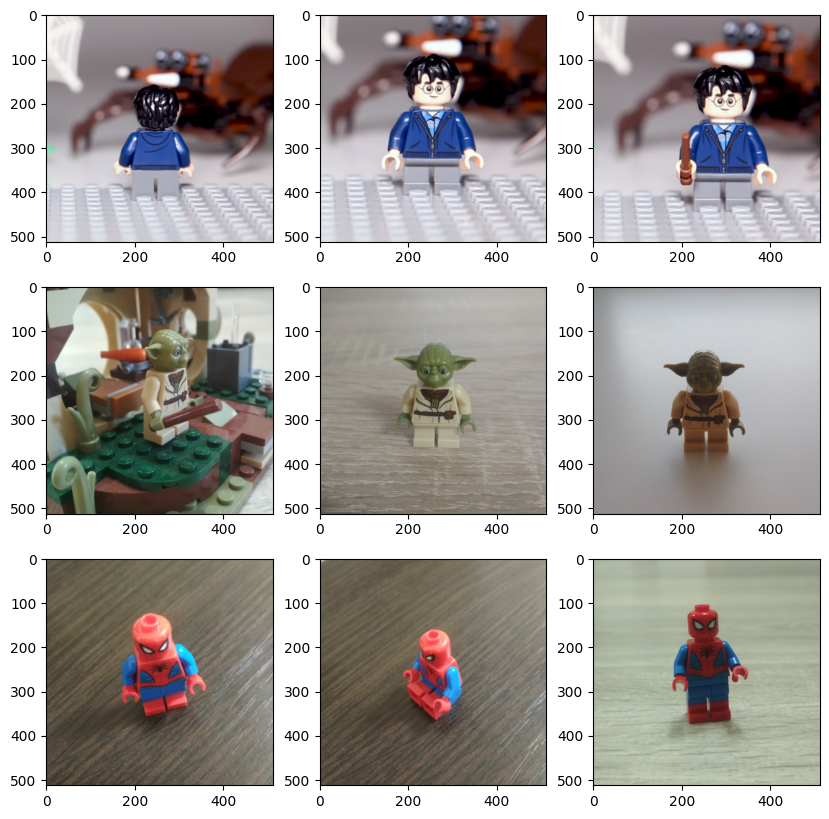

In [38]:
image_paths = ['harry-potter/0001/', 'star-wars/0001/', 'marvel/0001/']
index = ['001', '002', '003']

fig, axs = plt.subplots(3, 3, figsize=(10, 10))

for i in range(3):
    for j in range(3):
        image_path = os.path.join(image_paths[i], index[j] + '.jpg')
        image = mpimg.imread(image_path)
        axs[i, j].imshow(image)

plt.show()

U ovoj ćeliji se učitava CSV datoteka **index.csv** koristeći **pd.read_csv()** funkciju. Učitani podaci se smeštaju u DataFrame objekat **index_df**.

In [10]:
index_df = pd.read_csv('index.csv')
index_df

,path,class_id
0,marvel/0001/001.jpg,1
1,marvel/0001/002.jpg,1
2,marvel/0001/003.jpg,1
3,marvel/0001/004.jpg,1
4,marvel/0001/005.jpg,1
...,...,...
366,star-wars/0017/006.jpg,38
367,star-wars/0017/007.jpg,38
368,star-wars/0017/008.jpg,38
369,star-wars/0017/009.jpg,38


U ovoj ćeliji se učitava CSV datoteka **metadata.csv** koristeći **pd.read_csv()** funkciju. Učitani podaci se smeštaju u DataFrame objekat **metadata_df.**

In [11]:
metadata_df = pd.read_csv('metadata.csv', encoding='latin-1')
metadata_df

,class_id,lego_ids,lego_names,minifigure_name
0,1,[76115],['Spider Mech vs. Venom'],SPIDER-MAN
1,2,[76115],['Spider Mech vs. Venom'],VENOM
2,3,[76115],['Spider Mech vs. Venom'],AUNT MAY
3,4,[76115],['Spider Mech vs. Venom'],GHOST SPIDER
4,5,[75208],"[""Yoda's Hut""]",YODA
5,6,[75208],"[""Yoda's Hut""]",LUKE SKYWALKER
6,7,[75208],"[""Yoda's Hut""]",R2-D2
7,8,[75199],"[""General Grievous' Combat Speeder""]",MACE WINDU
8,9,[75199],"[""General Grievous' Combat Speeder""]",GENERAL GRIEVOUS
9,10,[75264],"[""Kylo Ren's Shuttle Microfighter""]",KYLO REN


U ovoj ćeliji se kombinuju podaci iz DataFrame objekata **index_df** i **metadata_df** na osnovu zajedničke kolone **class_id**. Rezultat spajanja se smešta u DataFrame objekat **data_df**.

In [12]:
data_df = pd.merge(index_df, metadata_df[['class_id', 'minifigure_name']], on='class_id')
data_df

,path,class_id,minifigure_name
0,marvel/0001/001.jpg,1,SPIDER-MAN
1,marvel/0001/002.jpg,1,SPIDER-MAN
2,marvel/0001/003.jpg,1,SPIDER-MAN
3,marvel/0001/004.jpg,1,SPIDER-MAN
4,marvel/0001/005.jpg,1,SPIDER-MAN
...,...,...,...
366,star-wars/0017/006.jpg,38,BOBA FETT
367,star-wars/0017/007.jpg,38,BOBA FETT
368,star-wars/0017/008.jpg,38,BOBA FETT
369,star-wars/0017/009.jpg,38,BOBA FETT


U ovoj ćeliji se poziva metoda **info()** nad DataFrame objektom **data_df**. Ova metoda prikazuje informacije o DataFrame-u, uključujući informacije o broju redova, broju kolona i tipovima podataka u kolonama.

In [13]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 371 entries, 0 to 370
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   path             371 non-null    object
 1   class_id         371 non-null    int64 
 2   minifigure_name  371 non-null    object
dtypes: int64(1), object(2)
memory usage: 11.6+ KB


Prikaz nasumično odabranih slika iz skupa podataka

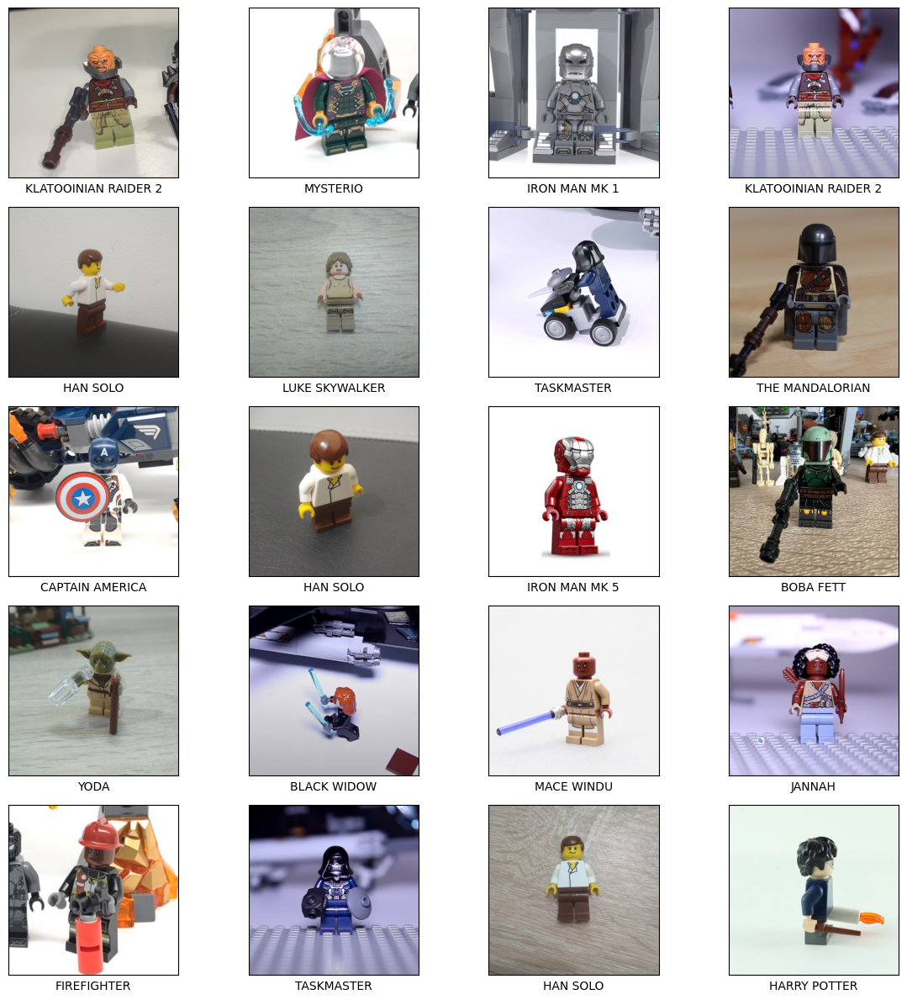

In [43]:
import matplotlib.gridspec as gridspec

sample_df = data_df.sample(20)

fig = plt.figure(figsize=(12, 12))
grid = gridspec.GridSpec(5, 4, figure=fig)

for i, (idx, row) in enumerate(sample_df.iterrows()):
    if i >= grid.get_geometry()[0] * grid.get_geometry()[1]:
        break
    ax = fig.add_subplot(grid[i])
    ax.grid(False)
    img = load_img(row['path'])
    ax.imshow(img)
    ax.set_xlabel(row['minifigure_name'])
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

Učitavanje testnog skupa podataka iz CSV datoteke "test.csv"

In [15]:
test_df = pd.read_csv('test.csv')
X_test = test_df.drop(columns = ['class_id'])
X_test

,path
0,test/001.jpg
1,test/002.jpg
2,test/003.jpg
3,test/004.jpg
4,test/005.jpg
...,...
74,test/075.jpg
75,test/076.jpg
76,test/077.jpg
77,test/078.jpg


Kreiranje ciljnog niza za testni skup podataka

In [16]:
y_test = test_df['class_id']
y_test

0     32
1     32
2     32
3     32
4      1
      ..
74    37
75    37
76    38
77    38
78    38
Name: class_id, Length: 79, dtype: int64

Spajanje testnog skupa podataka sa metapodacima

In [17]:
test_actual_df = pd.merge(test_df, metadata_df[['class_id', 'minifigure_name']], on='class_id')
test_actual_df = test_actual_df.sort_values('path')
test_actual_df

,path,class_id,minifigure_name
0,test/001.jpg,32,JANNAH
1,test/002.jpg,32,JANNAH
2,test/003.jpg,32,JANNAH
3,test/004.jpg,32,JANNAH
4,test/005.jpg,1,SPIDER-MAN
...,...,...,...
74,test/075.jpg,37,OBI-WAN KENOBI
75,test/076.jpg,37,OBI-WAN KENOBI
76,test/077.jpg,38,BOBA FETT
77,test/078.jpg,38,BOBA FETT


Izdvajanje obeležja (atributa) iz skupa podataka

In [18]:
X_data = data_df.drop(columns = ['class_id'])
X_data

,path,minifigure_name
0,marvel/0001/001.jpg,SPIDER-MAN
1,marvel/0001/002.jpg,SPIDER-MAN
2,marvel/0001/003.jpg,SPIDER-MAN
3,marvel/0001/004.jpg,SPIDER-MAN
4,marvel/0001/005.jpg,SPIDER-MAN
...,...,...
366,star-wars/0017/006.jpg,BOBA FETT
367,star-wars/0017/007.jpg,BOBA FETT
368,star-wars/0017/008.jpg,BOBA FETT
369,star-wars/0017/009.jpg,BOBA FETT


Izdvajanje ciljnog niza (klase) iz skupa podataka

In [19]:
y_data = data_df['class_id']
y_data

0       1
1       1
2       1
3       1
4       1
       ..
366    38
367    38
368    38
369    38
370    38
Name: class_id, Length: 371, dtype: int64

Podela skupa podataka na trening, validacioni i testni skup

In [20]:
X_train, X_val, y_train, y_val = train_test_split(X_data, y_data, test_size=0.20, random_state= 8)

Konverzija trening skupa podataka u oblik pogodan za model

In [21]:
X_train_converted = np.zeros((X_train.shape[0], 224, 224, 3))

for i in range(X_train.shape[0]):
    image = cv2.imread(X_train["path"].values[i])
    image = cv2.resize(image, dsize=(224,224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    X_train_converted[i] = image/255

y_train_converted = np.array(y_train)-1

Prikaz jedne slike iz konvertovanog trening skupa podataka

In [22]:
X_train_converted[0]


array([[[0.69803922, 0.68627451, 0.66666667],
        [0.69411765, 0.68235294, 0.6627451 ],
        [0.69411765, 0.68235294, 0.65490196],
        ...,
        [0.59215686, 0.54509804, 0.49019608],
        [0.59607843, 0.54901961, 0.49411765],
        [0.59215686, 0.54509804, 0.49019608]],

       [[0.68627451, 0.6745098 , 0.65490196],
        [0.68627451, 0.6745098 , 0.64705882],
        [0.68235294, 0.67058824, 0.64313725],
        ...,
        [0.60392157, 0.55686275, 0.50196078],
        [0.60392157, 0.55686275, 0.50196078],
        [0.59607843, 0.54901961, 0.49411765]],

       [[0.67843137, 0.6627451 , 0.63921569],
        [0.67843137, 0.6627451 , 0.63921569],
        [0.6745098 , 0.65490196, 0.63137255],
        ...,
        [0.6       , 0.55294118, 0.49803922],
        [0.60392157, 0.55686275, 0.50196078],
        [0.6       , 0.55294118, 0.49803922]],

       ...,

       [[0.58431373, 0.55686275, 0.52156863],
        [0.66666667, 0.63529412, 0.61176471],
        [0.63529412, 0

Konverzija validacionog skupa podataka u oblik pogodan za model

In [23]:
X_val_converted = np.zeros((X_val.shape[0], 224, 224, 3))

for i in range(X_val.shape[0]):
    image = cv2.imread(X_val["path"].values[i])
    image = cv2.resize(image, dsize=(224,224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    X_val_converted[i] = image/255

y_val_converted = np.array(y_val)-1

Prikaz jedne slike iz konvertovanog validacionog skupa podataka

In [24]:
X_val_converted[0]

array([[[0.37254902, 0.34117647, 0.2745098 ],
        [0.38823529, 0.34901961, 0.28235294],
        [0.38431373, 0.34901961, 0.28235294],
        ...,
        [0.56078431, 0.54901961, 0.48235294],
        [0.56470588, 0.54901961, 0.48235294],
        [0.55686275, 0.54509804, 0.47843137]],

       [[0.39215686, 0.36470588, 0.29411765],
        [0.41176471, 0.38431373, 0.31372549],
        [0.41176471, 0.37647059, 0.30980392],
        ...,
        [0.56470588, 0.55294118, 0.48627451],
        [0.57254902, 0.56078431, 0.49411765],
        [0.56862745, 0.55686275, 0.49019608]],

       [[0.41960784, 0.39215686, 0.32156863],
        [0.41176471, 0.38431373, 0.31372549],
        [0.40392157, 0.37647059, 0.30588235],
        ...,
        [0.56470588, 0.55294118, 0.48627451],
        [0.58039216, 0.56862745, 0.50196078],
        [0.56862745, 0.55686275, 0.49019608]],

       ...,

       [[0.30980392, 0.27058824, 0.23529412],
        [0.3372549 , 0.29803922, 0.2627451 ],
        [0.31372549, 0

Konverzija testnog skupa podataka u oblik pogodan za model

In [25]:
X_test_converted = np.zeros((X_test.shape[0], 224, 224, 3))

for i in range(X_test.shape[0]-1):
    image = cv2.imread(X_test["path"].values[i])
    image = cv2.resize(image, dsize=(224,224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    X_test_converted[i] = image/255

y_test_converted = np.array(y_test)

# **DenseNet121**
**DenseNet** je inovativna arhitektura neuronske mreže koja se koristi za vizuelno prepoznavanje objekata. Za razliku od tradicionalnih CNN modela, DenseNet koristi gustu povezanost između slojeva, čime zahteva manje parametara i eliminiše potrebu za učenjem redundantnih mapa karakteristika. Ova karakteristika je posebno korisna jer se pokazalo da mnogi slojevi u drugim modelima doprinose vrlo malo i mogu biti izostavljeni [1].

Jedan od problema sa dubokim mrežama bio je protok informacija i gradijenta tokom obuke. **DenseNet** rešava ovaj problem tako što omogućava svakom sloju direktan pristup gradijentima iz funkcije gubitka i originalne ulazne slike. Ovo poboljšava efikasnost obuke i olakšava prenošenje informacija kroz mrežu [1].

**DenseNet** je prilično sličan ResNetu, ali se razlikuje u načinu povezivanja slojeva. Dok ResNet koristi aditivni metod spajanja slojeva, **DenseNet** koristi konkatenaciju izlaza prethodnog sloja sa budućim slojem. Ova arhitektura je postala popularna u istraživačkoj zajednici i pokazala je izuzetne rezultate u zadacima klasifikacije slika [1].

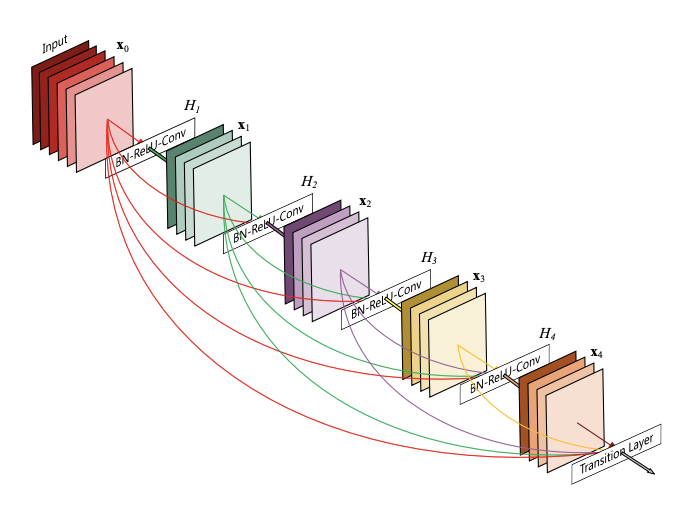
[2]

Kreiranje modela na osnovu DenseNet121

In [26]:
from tensorflow.keras.applications import DenseNet121
dense_net = tf.keras.applications.DenseNet121()

dense_net_layer=Dropout(0.5)(dense_net.layers[-2].output)
number_of_classes = len(data_df['class_id'].unique())

last_layer = Dense(number_of_classes, activation="softmax")(dense_net_layer)
model = Model(dense_net.input, last_layer)

model.compile(loss='sparse_categorical_crossentropy',
              optimizer=Adam(0.0001),
              metrics=['accuracy'])

33188688/33188688 [==============================] - 0s 0us/step


Čuvanje najboljeg modela tokom treniranja

In [27]:
from tensorflow.keras.callbacks import ModelCheckpoint

checkpoint = ModelCheckpoint(filepath='model.h5', monitor="val_accuracy", save_best_only=True, verbose=1)

Rano zaustavljanje treninga ako se performanse ne poboljšavaju

In [28]:
from tensorflow.keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor='val_accuracy', mode='max', patience=5,  restore_best_weights=True)

Treniranje modela

In [29]:
hist=model.fit(
    X_train_converted,
    y_train_converted,
    epochs=50,
    validation_data=(X_val_converted, y_val_converted),
    shuffle=True,
    batch_size=10,
    callbacks=[checkpoint, early_stopping]
)

Epoch 1/50
30/30 [==============================] - ETA: 0s - loss: 3.9455 - accuracy: 0.1047
Epoch 1: val_accuracy improved from -inf to 0.13333, saving model to model.h5
30/30 [==============================] - 168s 5s/step - loss: 3.9455 - accuracy: 0.1047 - val_loss: 3.4190 - val_accuracy: 0.1333
Epoch 2/50
30/30 [==============================] - ETA: 0s - loss: 2.4606 - accuracy: 0.3277
Epoch 2: val_accuracy improved from 0.13333 to 0.42667, saving model to model.h5
30/30 [==============================] - 143s 5s/step - loss: 2.4606 - accuracy: 0.3277 - val_loss: 2.5487 - val_accuracy: 0.4267
Epoch 3/50
30/30 [==============================] - ETA: 0s - loss: 1.4683 - accuracy: 0.6655
Epoch 3: val_accuracy improved from 0.42667 to 0.56000, saving model to model.h5
30/30 [==============================] - 141s 5s/step - loss: 1.4683 - accuracy: 0.6655 - val_loss: 1.9561 - val_accuracy: 0.5600
Epoch 4/50
30/30 [==============================] - ETA: 0s - loss: 0.8658 - accuracy: 0

Prikaz rezultata treniranja (grafici tačnosti i gubitka)

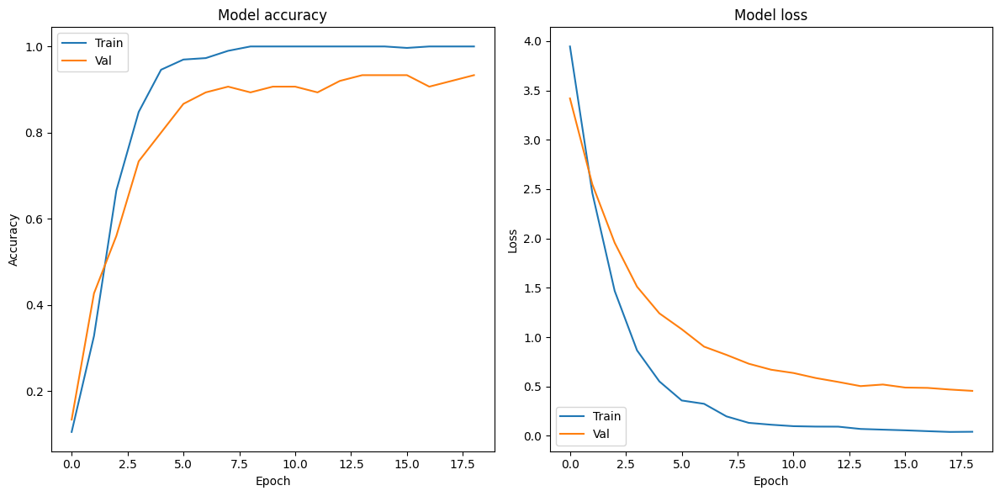

In [45]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

ax1.plot(hist.history['accuracy'])
ax1.plot(hist.history['val_accuracy'])
ax1.set_title('Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epoch')
ax1.legend(['Train', 'Val'], loc='upper left')

ax2.plot(hist.history['loss'])
ax2.plot(hist.history['val_loss'])
ax2.set_title('Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.legend(['Train', 'Val'], loc='lower left')

plt.tight_layout()
plt.show()

Figurica koja je na slici ima predviđenu vrednost koja je napisana iznad nje, dok je ispod slike napisana prava vrednost, odnosno klasa kojoj ta figurica zaista pripada. Ovo omogućava vizuelnu proveru tačnosti klasifikacije i upoređivanje predviđene vrednosti sa stvarnom klasom figurice

In [31]:
from tensorflow.keras import models as tf_models

model = tf_models.load_model('model.h5')

Prikaz predikcije za testni skup podataka

1/1 [==============================] - 0s 114ms/step


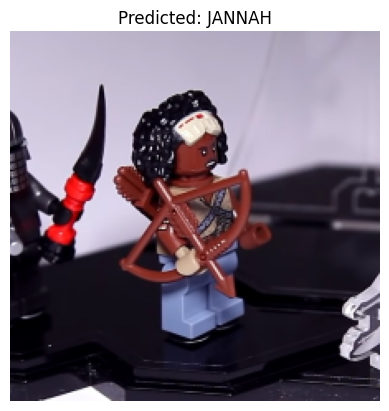

1/1 [==============================] - 0s 123ms/step


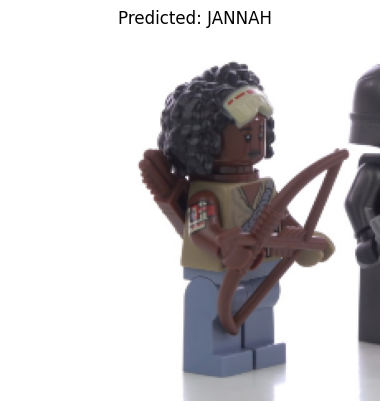

1/1 [==============================] - 0s 122ms/step


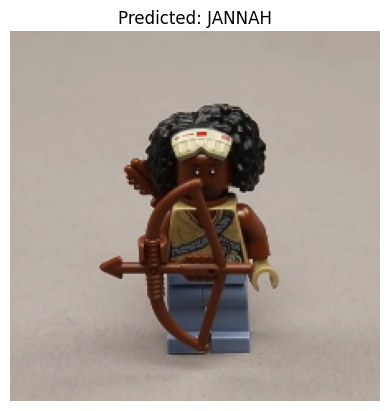

1/1 [==============================] - 0s 119ms/step


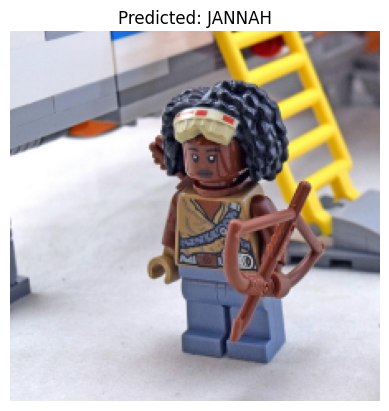

1/1 [==============================] - 0s 115ms/step


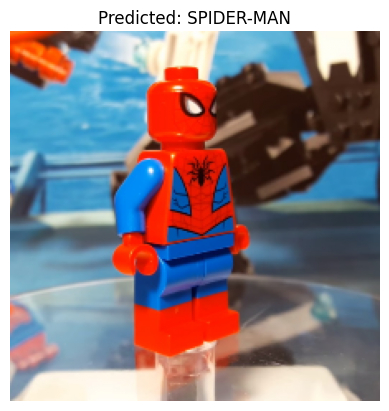

1/1 [==============================] - 0s 152ms/step


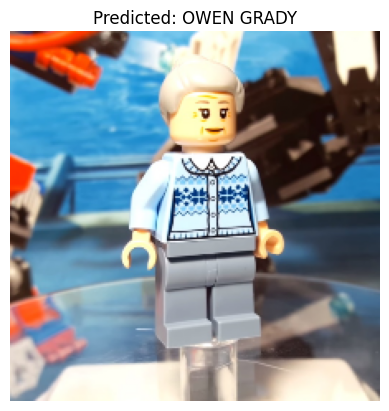

1/1 [==============================] - 0s 169ms/step


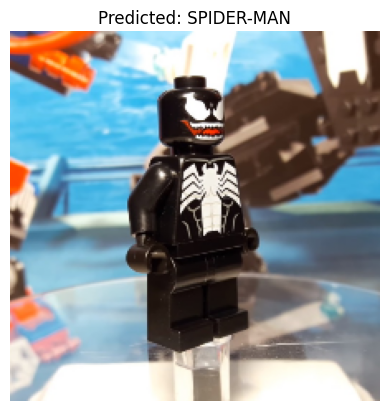

1/1 [==============================] - 0s 158ms/step


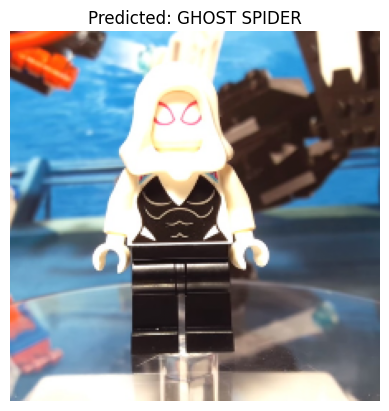

1/1 [==============================] - 0s 165ms/step


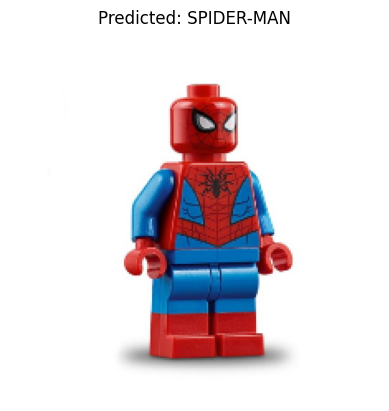

1/1 [==============================] - 0s 173ms/step


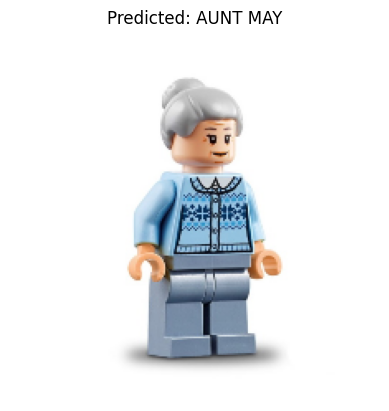

1/1 [==============================] - 0s 114ms/step


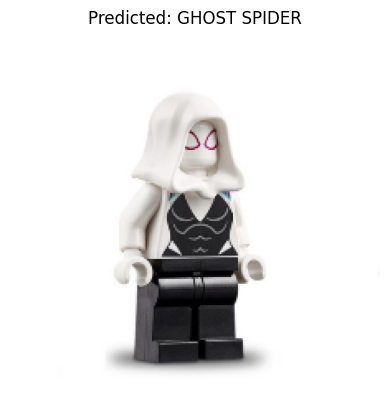

1/1 [==============================] - 0s 125ms/step


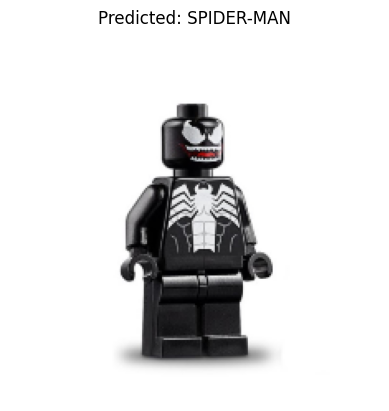

1/1 [==============================] - 0s 124ms/step


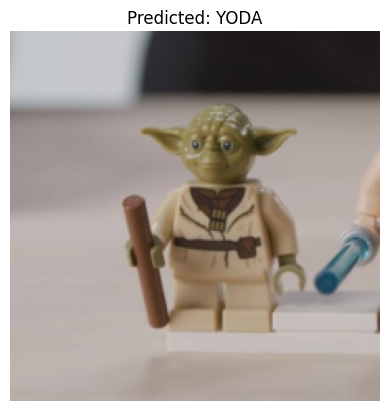

1/1 [==============================] - 0s 112ms/step


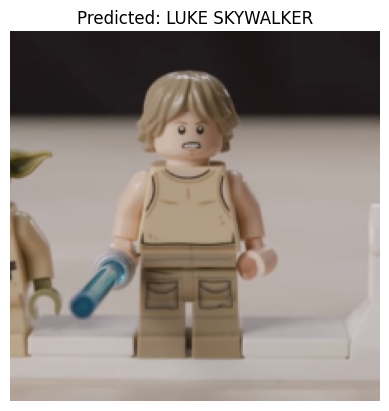

1/1 [==============================] - 0s 116ms/step


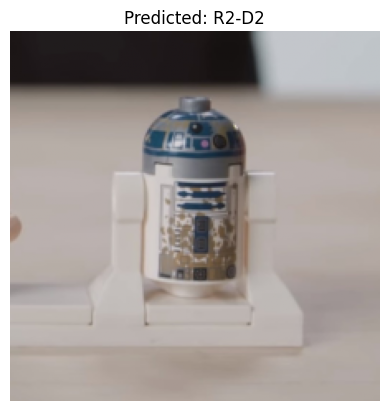

1/1 [==============================] - 0s 119ms/step


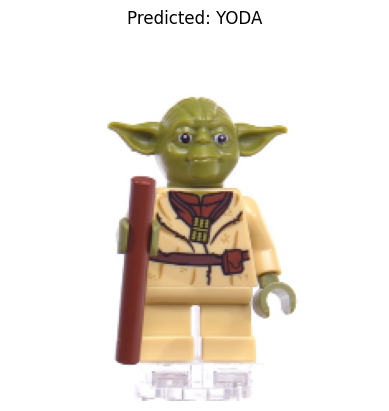

1/1 [==============================] - 0s 108ms/step


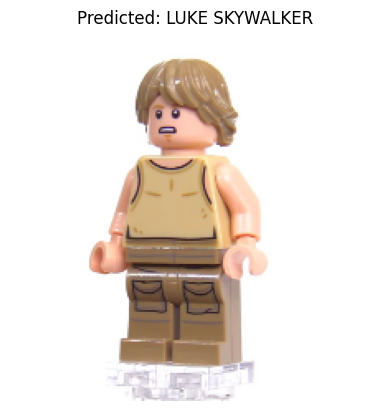

1/1 [==============================] - 0s 116ms/step


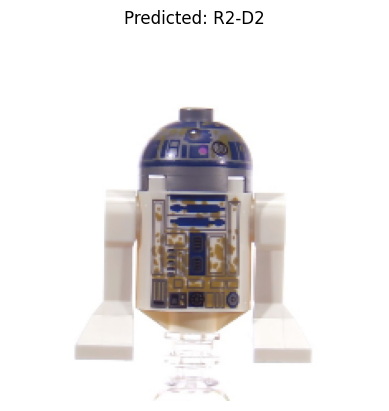

1/1 [==============================] - 0s 113ms/step


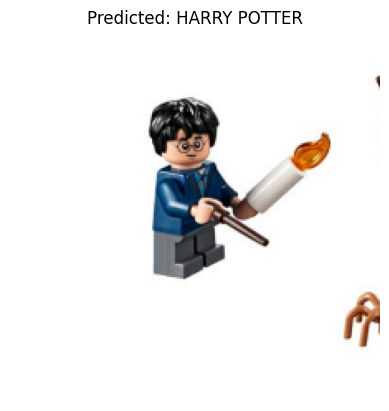

1/1 [==============================] - 0s 121ms/step


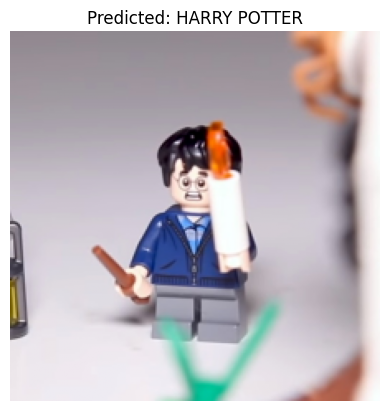

1/1 [==============================] - 0s 112ms/step


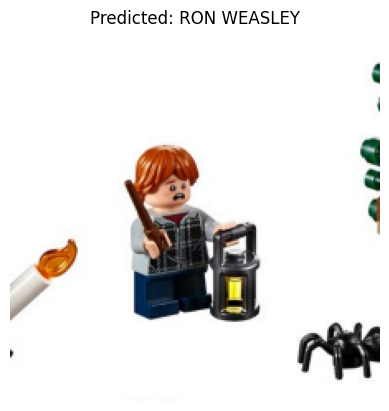

1/1 [==============================] - 0s 126ms/step


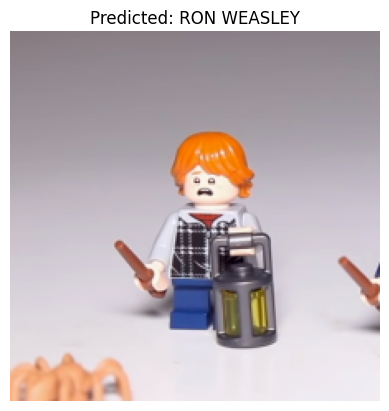

1/1 [==============================] - 0s 113ms/step


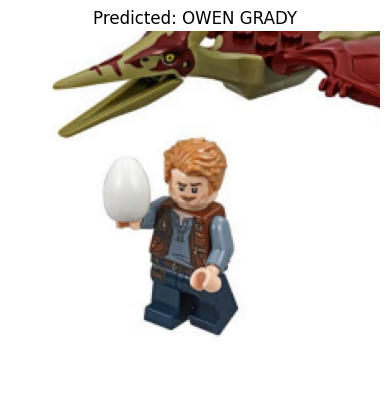

1/1 [==============================] - 0s 134ms/step


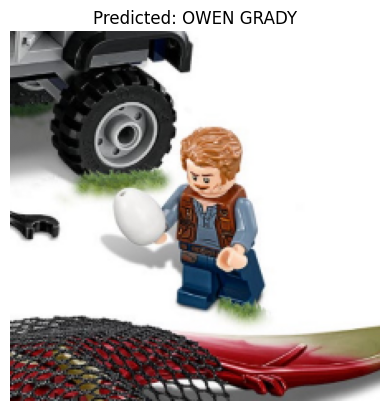

1/1 [==============================] - 0s 120ms/step


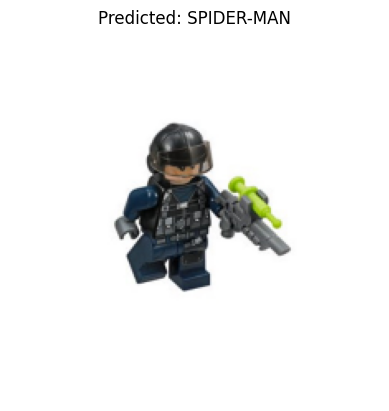

1/1 [==============================] - 0s 126ms/step


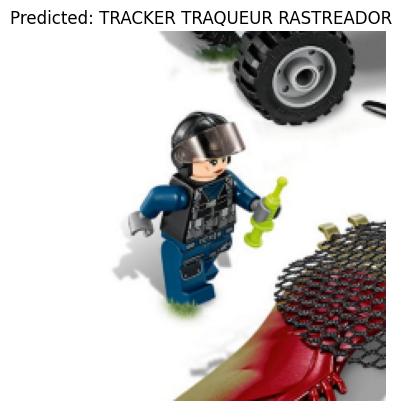

1/1 [==============================] - 0s 123ms/step


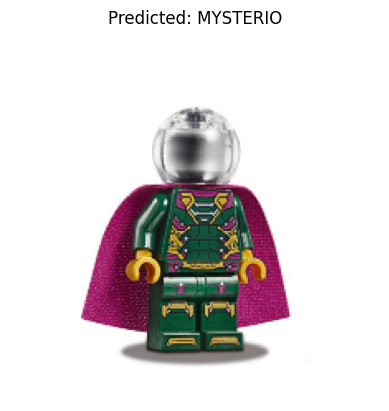

1/1 [==============================] - 0s 117ms/step


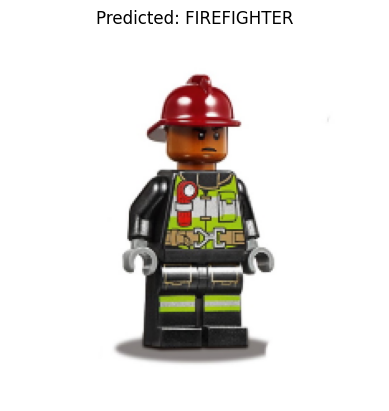

1/1 [==============================] - 0s 121ms/step


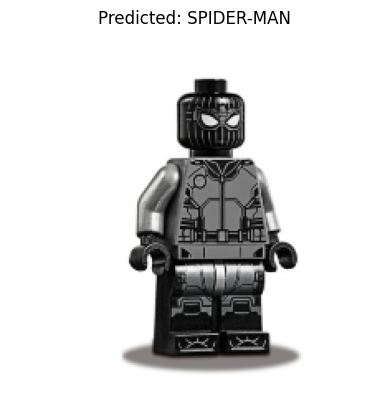

1/1 [==============================] - 0s 132ms/step


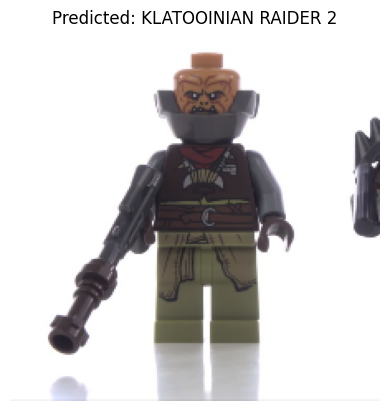

1/1 [==============================] - 0s 131ms/step


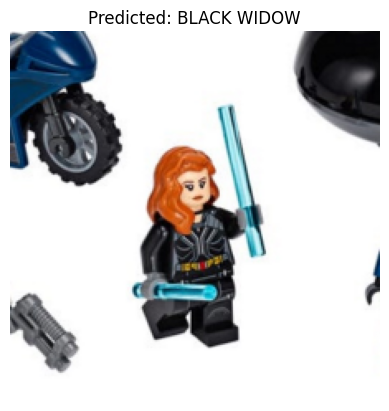

1/1 [==============================] - 0s 119ms/step


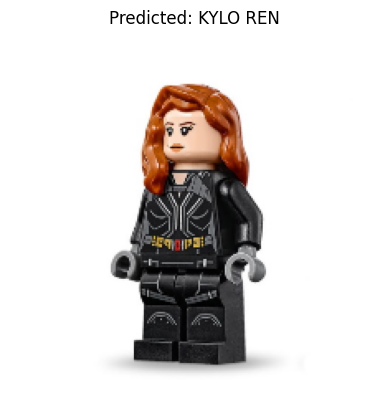

1/1 [==============================] - 0s 127ms/step


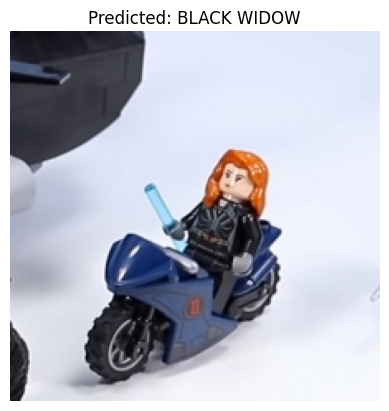

1/1 [==============================] - 0s 121ms/step


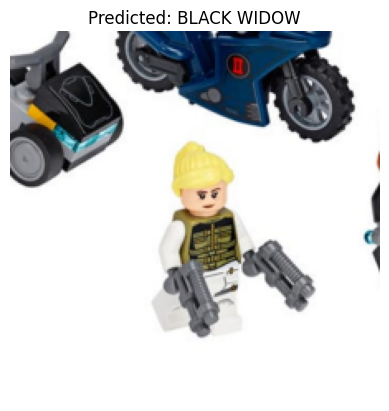

1/1 [==============================] - 0s 126ms/step


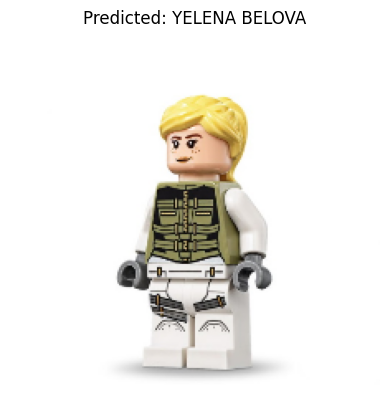

1/1 [==============================] - 0s 129ms/step


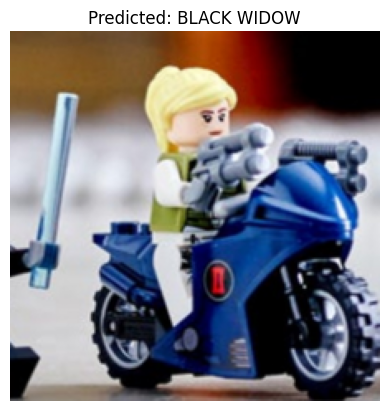

1/1 [==============================] - 0s 136ms/step


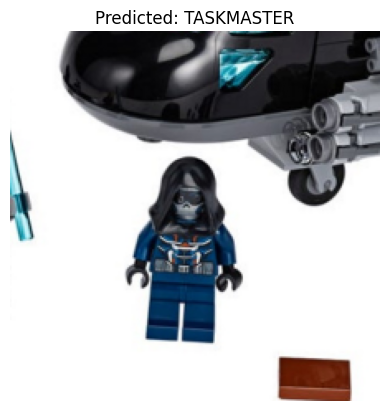

1/1 [==============================] - 0s 123ms/step


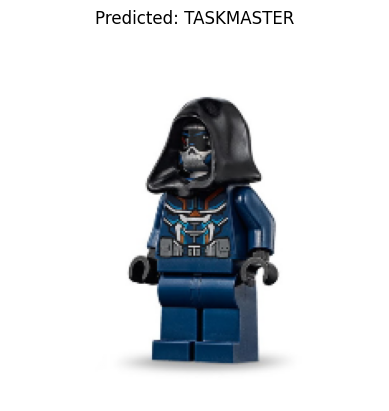

1/1 [==============================] - 0s 166ms/step


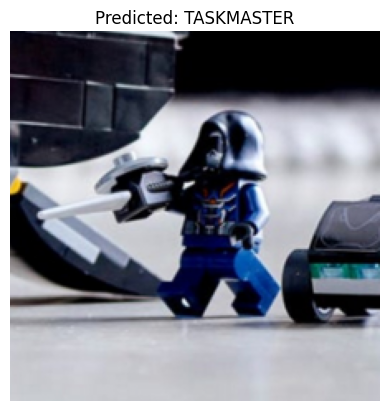

1/1 [==============================] - 0s 170ms/step


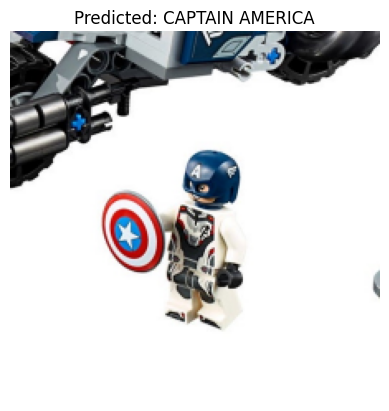

1/1 [==============================] - 0s 164ms/step


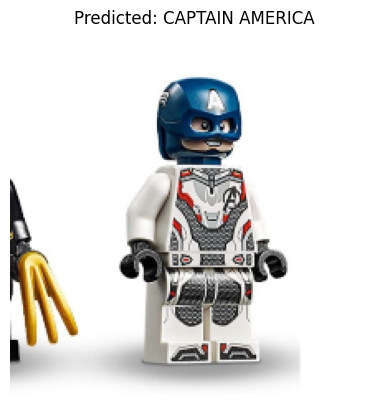

1/1 [==============================] - 0s 189ms/step


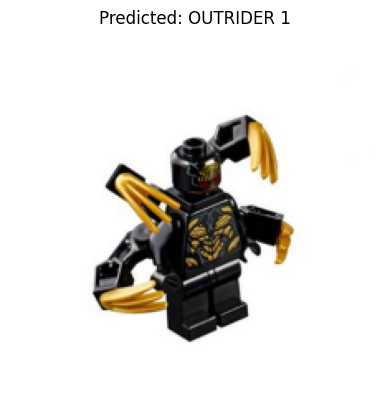

1/1 [==============================] - 0s 188ms/step


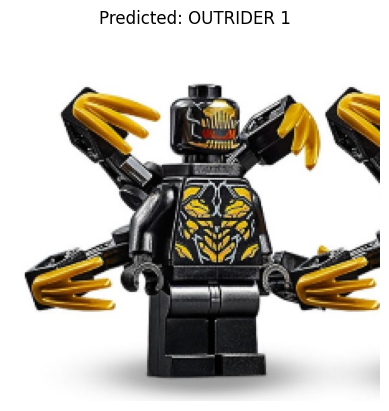

1/1 [==============================] - 0s 128ms/step


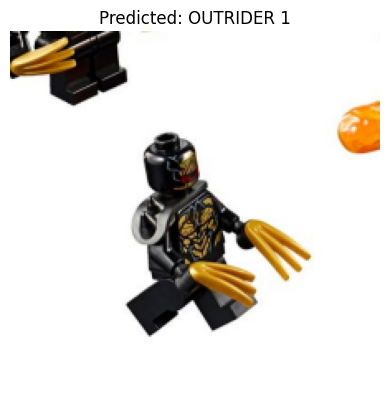

1/1 [==============================] - 0s 125ms/step


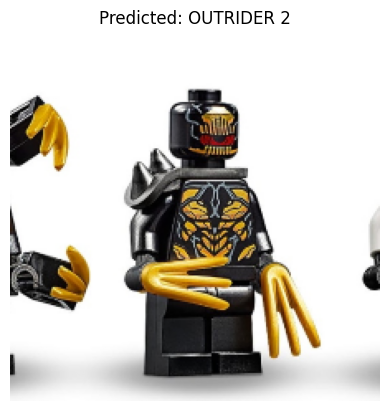

1/1 [==============================] - 0s 139ms/step


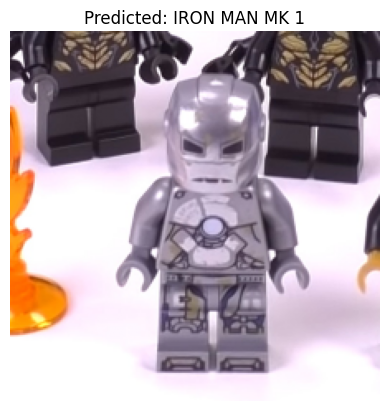

1/1 [==============================] - 0s 136ms/step


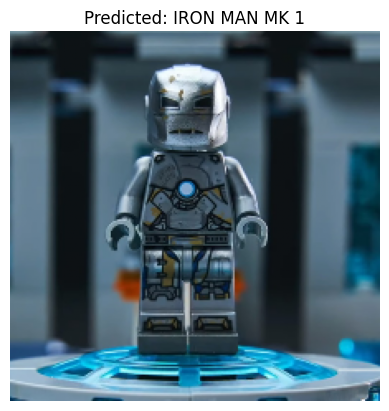

1/1 [==============================] - 0s 162ms/step


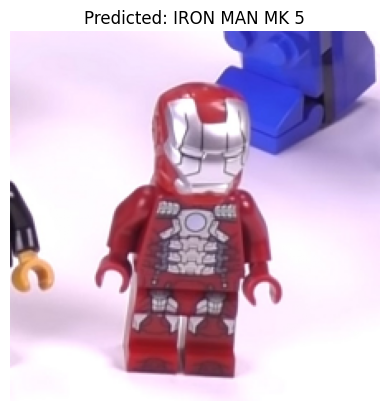

1/1 [==============================] - 0s 142ms/step


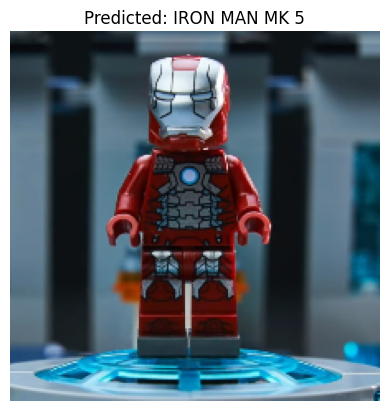

1/1 [==============================] - 0s 140ms/step


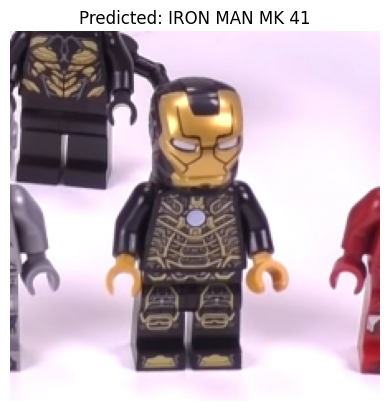

1/1 [==============================] - 0s 135ms/step


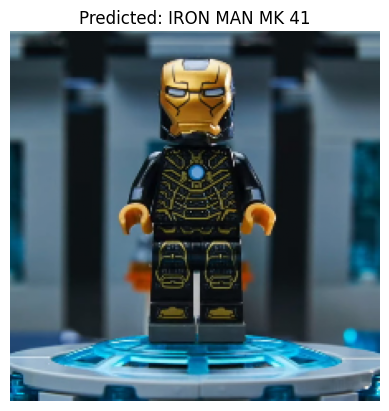

1/1 [==============================] - 0s 150ms/step


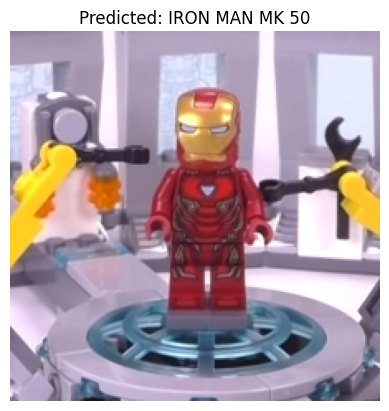

1/1 [==============================] - 0s 138ms/step


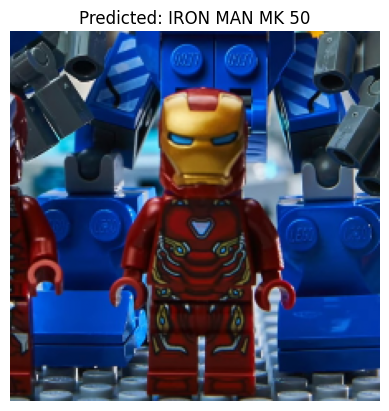

1/1 [==============================] - 0s 157ms/step


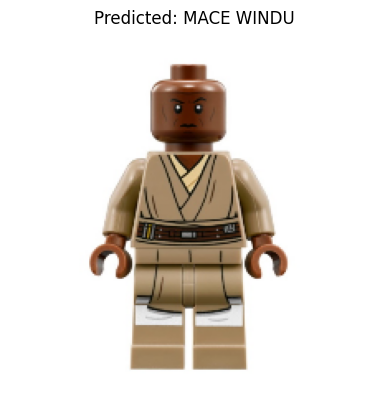

1/1 [==============================] - 0s 158ms/step


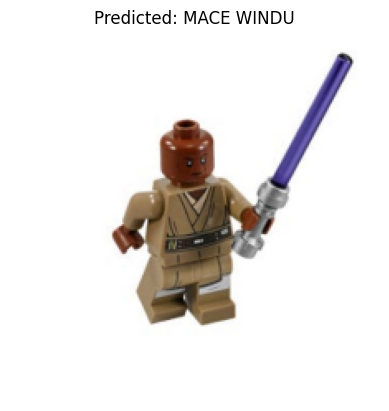

1/1 [==============================] - 0s 160ms/step


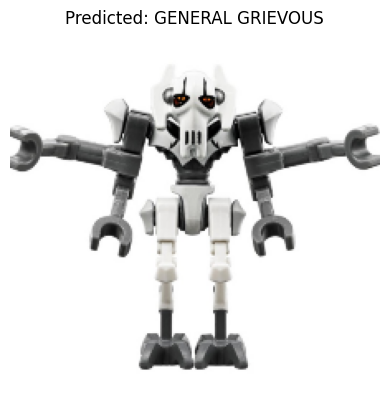

1/1 [==============================] - 0s 157ms/step


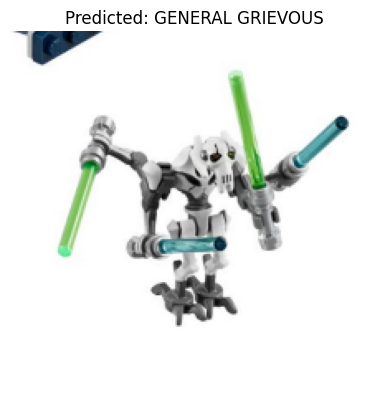

1/1 [==============================] - 0s 160ms/step


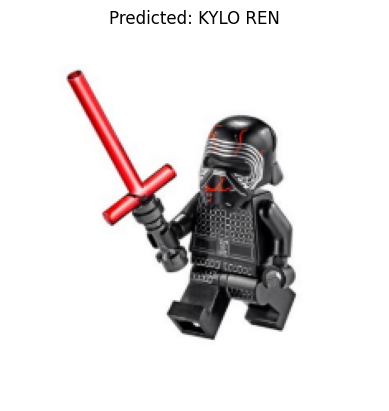

1/1 [==============================] - 0s 158ms/step


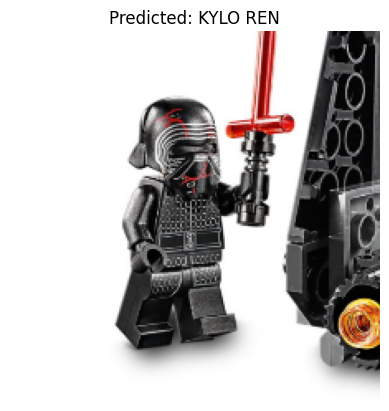

1/1 [==============================] - 0s 170ms/step


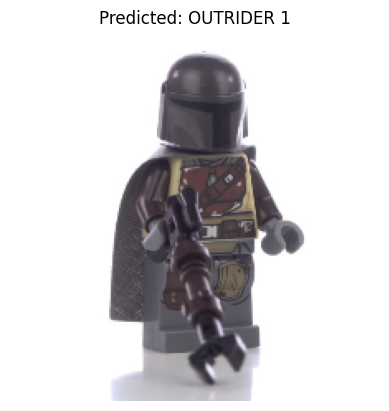

1/1 [==============================] - 0s 159ms/step


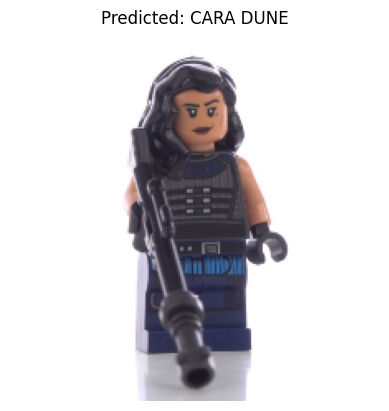

1/1 [==============================] - 0s 155ms/step


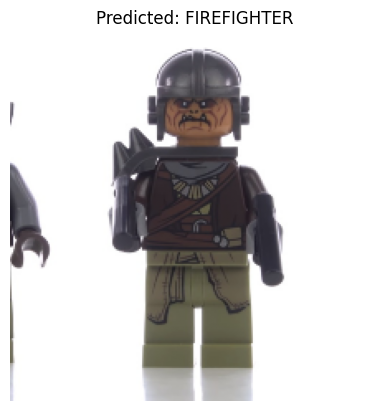

1/1 [==============================] - 0s 156ms/step


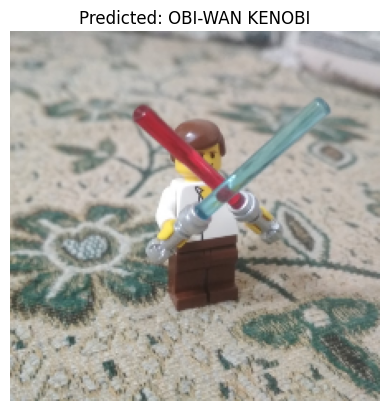

1/1 [==============================] - 0s 162ms/step


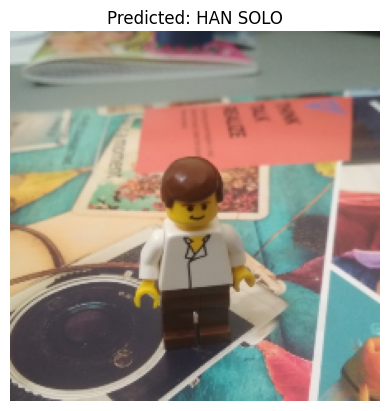

1/1 [==============================] - 0s 147ms/step


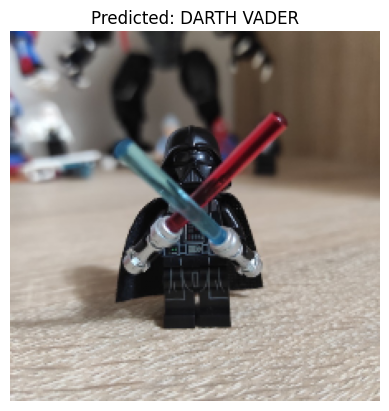

1/1 [==============================] - 0s 160ms/step


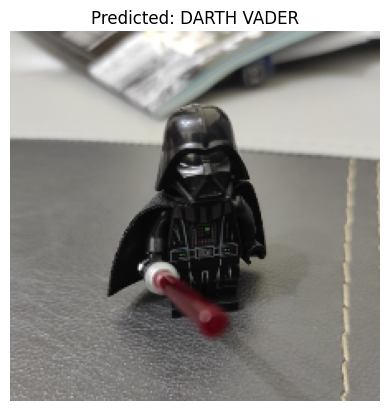

1/1 [==============================] - 0s 170ms/step


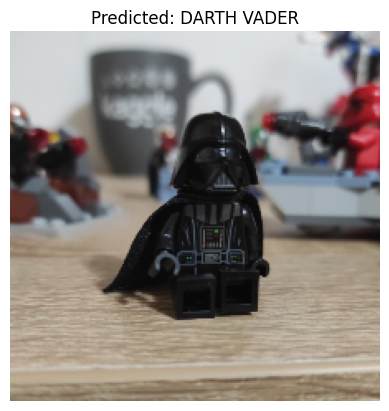

1/1 [==============================] - 0s 166ms/step


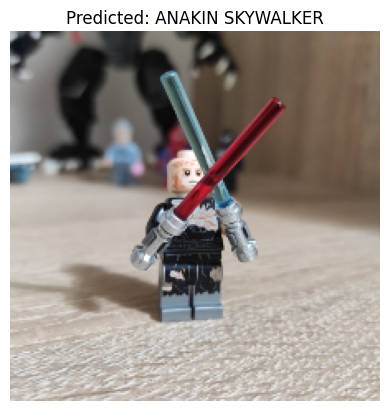

1/1 [==============================] - 0s 255ms/step


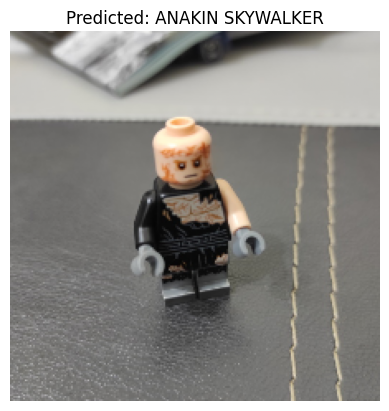

1/1 [==============================] - 0s 253ms/step


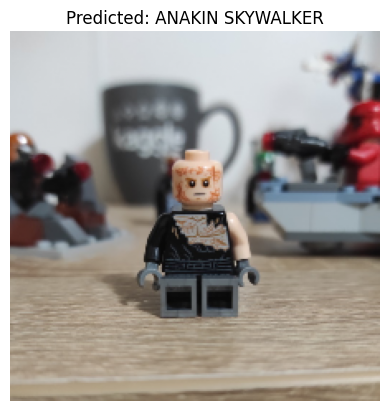

1/1 [==============================] - 0s 163ms/step


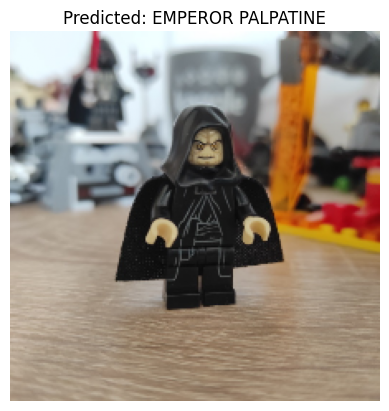

1/1 [==============================] - 0s 163ms/step


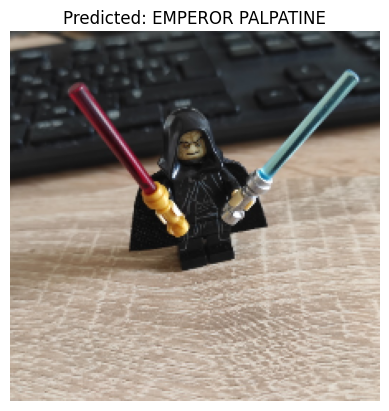

1/1 [==============================] - 0s 161ms/step


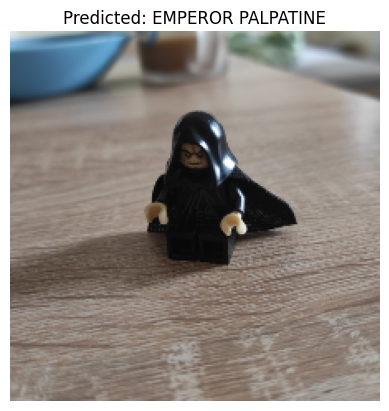

1/1 [==============================] - 0s 167ms/step


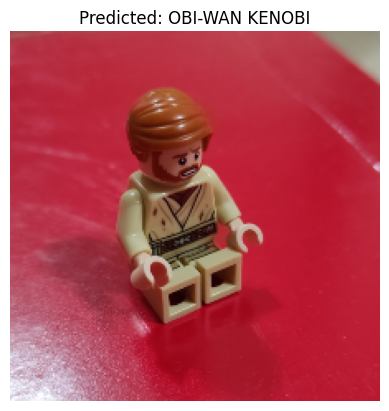

1/1 [==============================] - 0s 157ms/step


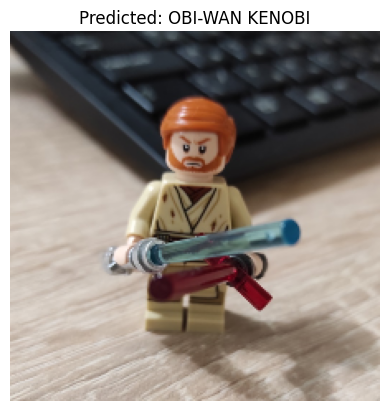

1/1 [==============================] - 0s 115ms/step


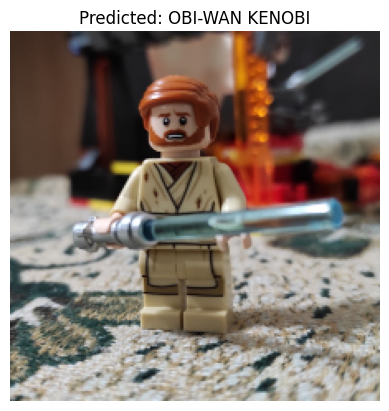

1/1 [==============================] - 0s 165ms/step


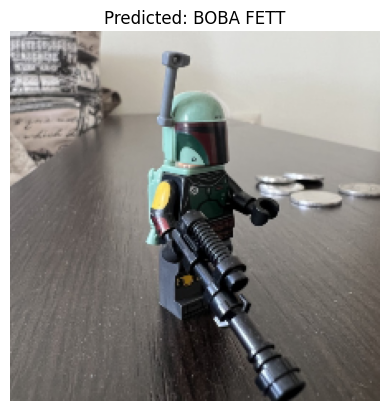

1/1 [==============================] - 0s 177ms/step


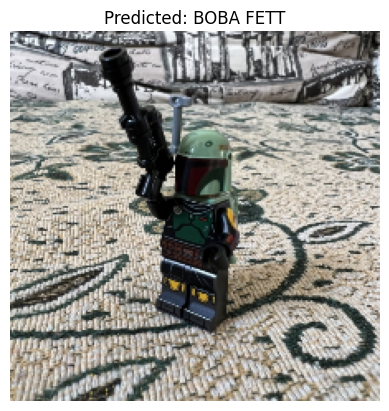

1/1 [==============================] - 0s 159ms/step


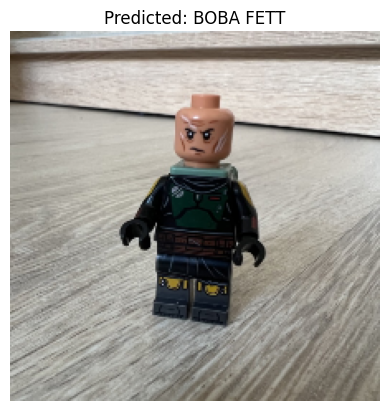

In [35]:
for i in range(len(X_test_converted)):
    image = cv2.imread(X_test['path'].values[i])
    image = cv2.resize(image, dsize=(224, 224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) / 255.0

    plt.imshow(image)
    plt.axis('off')

    # Predikcija
    img_array = np.expand_dims(image, axis=0)
    predictions = model.predict(img_array)
    predicted_class = np.argmax(predictions)
    predicted_minifigure = metadata_df.loc[metadata_df['class_id'] == predicted_class+1, 'minifigure_name'].values[0]

    plt.title(f"Predicted: {predicted_minifigure}")
    plt.show()


Evaluacija modela na validacionom skupu podataka

In [36]:
loss, accuracy = model.evaluate(X_val_converted, y_val_converted, verbose=1)

print('Test loss:', loss)
print('Test accuracy:', accuracy)

3/3 [==============================] - 7s 2s/step - loss: 0.5038 - accuracy: 0.9333
Test loss: 0.5037540793418884
Test accuracy: 0.9333333373069763


# **Zaključak:**

U ovom radu smo se bavili klasifikacijom LEGO figurica primenom neuronskih mreža. Nakon pripreme podataka i podele skupa podataka na trening, validacioni i testni skup, kreirali smo model korišćenjem DenseNet121 arhitekture.

Nakon treniranja modela, evaluirali smo ga na validacionom skupu i dobili smo visoku tačnost od 93.33%. Ovo ukazuje na dobru sposobnost modela da klasifikuje LEGO figurice na osnovu slika.

Uzimajući u obzir rezultate klasifikacije, moguće je dalje unaprediti model na nekoliko načina. Prvo, mogli bismo eksperimentisati sa drugim arhitekturama neuronskih mreža, kao što su VGGNet ili ResNet, kako bismo uporedili njihovu performansu sa DenseNet121. Takođe, mogli bismo pokušati fine-tjning modela, tj. trenirati samo određene slojeve umesto svih slojeva, kako bismo poboljšali performanse.

Takođe, moguće unapređenje može biti proširenje skupa podataka dodavanjem više slika različitih LEGO figurica. Ovo bi omogućilo modelu da nauči više raznolikih karakteristika i moglo bi rezultirati boljom generalizacijom.

U budućim istraživanjima možemo razmotriti i primenu tehnika za obradu slika, kao što su augmentacija podataka ili primena tehnika za smanjenje preprilagođavanja (overfittinga), kako bismo dalje unapredili performanse modela.

# **Literatura**

[1] Pablo Ruiz (2018). Understanding and visualizing DenseNets. https://towardsdatascience.com/understanding-and-visualizing-densenets-7f688092391a

[2] Huang, G., Liu, Z., Van Der Maaten, L., & Weinberger, K. Q. (2017). Densely connected convolutional networks. https://openaccess.thecvf.com/content_cvpr_2017/papers/Huang_Densely_Connected_Convolutional_CVPR_2017_paper.pdf